<a href="https://colab.research.google.com/github/dvelazquez/SelfDrivingCar/blob/master/Self%20Driving%20RC%20Car%20Behavioural%20Cloning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
"""
   Trying to reproduce Udemy's Self Driving car course
   with real data taken from the CAN bus and a camera
   in El Charrito RC Car
   
   Daniel Velazquez - September 2019
"""

In [0]:
   #  Import libraries
!pip install keras==2.1.5

import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

   # Import data
!git clone https://github.com/dvelazquez/SelfDrivingCar

     |████████████████████████████████| 337kB 3.4MB/s 
  Found existing installation: Keras 2.2.5
    Uninstalling Keras-2.2.5:
      Successfully uninstalled Keras-2.2.5


Using TensorFlow backend.


Cloning into 'SelfDrivingCar'...
remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 8176 (delta 0), reused 1 (delta 0), pack-reused 8171
Receiving objects: 100% (8176/8176), 1.89 GiB | 52.19 MiB/s, done.
Resolving deltas: 100% (252/252), done.
Checking out files: 100% (7869/7869), done.


In [0]:
!mkdir AllData
!mv SelfDrivingCar/Charrito/Log*/*.jpg AllData
!mv SelfDrivingCar/Charrito/RecoveryLap/*.* AllData
!mv SelfDrivingCar/Charrito/Log*/*.csv AllData


In [0]:
#!ls AllData/*507.jpg

In [0]:
datadir = 'AllData'
columns = ['Camera', 'Steering']
data1= pd.read_csv(os.path.join(datadir, 'Log07.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data1['Steering']=(((data1['Steering']*100)-73)/7)   # This operation transforms the logged data to -1 to 1
data1.head()


columns = ['Camera', 'Steering']
data2= pd.read_csv(os.path.join(datadir, 'Log08.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data2['Steering']=(((data2['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data2.head()

columns = ['Camera', 'Steering']
data3= pd.read_csv(os.path.join(datadir, 'Log09.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data3['Steering']=(((data3['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data3.head()

columns = ['Camera', 'Steering']
data4= pd.read_csv(os.path.join(datadir, 'Log10.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data4['Steering']=(((data4['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data4.head()

columns = ['Camera', 'Steering']
data5= pd.read_csv(os.path.join(datadir, 'Log11.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data5['Steering']=(((data5['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data5.head()

columns = ['Camera', 'Steering']
data6= pd.read_csv(os.path.join(datadir, 'Log12.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data6['Steering']=(((data6['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data6.head()

columns = ['Camera', 'Steering']
data7= pd.read_csv(os.path.join(datadir, 'Log13.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data7['Steering']=(((data7['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data7.head()

columns = ['Camera', 'Steering']
data8= pd.read_csv(os.path.join(datadir, 'Log14.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data8['Steering']=(((data8['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data8.head()

columns = ['Camera', 'Steering']
data9= pd.read_csv(os.path.join(datadir, 'Log15.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data9['Steering']=(((data9['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data9.head()

columns = ['Camera', 'Steering']
data10= pd.read_csv(os.path.join(datadir, 'Log16.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data10['Steering']=(((data10['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data10.head()

columns = ['Camera', 'Steering']
data11= pd.read_csv(os.path.join(datadir, 'Log17.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data11['Steering']=(((data11['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data11.head()

columns = ['Camera', 'Steering']
data12= pd.read_csv(os.path.join(datadir, 'Log18.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data12['Steering']=(((data12['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data12.head()

columns = ['Camera', 'Steering']
data13= pd.read_csv(os.path.join(datadir, 'Log19.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data13['Steering']=(((data13['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data13.head()

columns = ['Camera', 'Steering']
data14= pd.read_csv(os.path.join(datadir, 'RecoveryLog.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data14['Steering']=(((data14['Steering']*100)-73)/7)  # This operation transforms the logged data to -1 to 1
data14.head()

,Camera,Steering
0,Charrito_RecoveryLap_Pic_8.jpg,-0.285714
1,Charrito_RecoveryLap_Pic_9.jpg,-0.714286
2,Charrito_RecoveryLap_Pic_10.jpg,-0.714286
3,Charrito_RecoveryLap_Pic_11.jpg,-0.714286
4,Charrito_RecoveryLap_Pic_12.jpg,-0.714286


                     Camera  Steering
0  Charrito_Log07_Pic_1.jpg  0.142857
Total data1: 227
Total data2: 334
Total data3: 320
Total data4: 100
Total data5: 70
Total data6: 52
Total data7: 313
Total data8: 440
Total data9: 296
Total data10: 681
Total data11: 692
Total data12: 808
Total data13: 730
Total data14: 495
Total data: 5558
Max Steering value 1.0
Min Steering value -1.0
Mean Steering value -0.07695471135557566


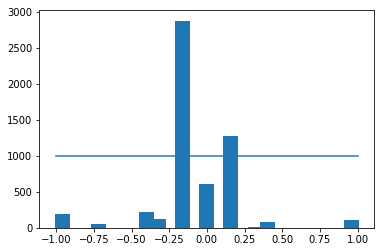

In [0]:
   # Remove path from Camera's data file name
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data1['Camera'] = data1['Camera'].apply(path_leaf)
data2['Camera'] = data2['Camera'].apply(path_leaf)
data3['Camera'] = data3['Camera'].apply(path_leaf)
data4['Camera'] = data4['Camera'].apply(path_leaf)
data5['Camera'] = data5['Camera'].apply(path_leaf)
data6['Camera'] = data6['Camera'].apply(path_leaf)
data7['Camera'] = data7['Camera'].apply(path_leaf)
data8['Camera'] = data8['Camera'].apply(path_leaf)
data9['Camera'] = data9['Camera'].apply(path_leaf)
data10['Camera'] = data10['Camera'].apply(path_leaf)
data11['Camera'] = data11['Camera'].apply(path_leaf)
data12['Camera'] = data12['Camera'].apply(path_leaf)
data13['Camera'] = data13['Camera'].apply(path_leaf)
data14['Camera'] = data14['Camera'].apply(path_leaf)
data= data1.append(data2, ignore_index= True)
data= data.append(data3, ignore_index= True)
data= data.append(data4, ignore_index= True)
data= data.append(data5, ignore_index= True)
data= data.append(data6, ignore_index= True)
data= data.append(data7, ignore_index= True)
data= data.append(data8, ignore_index= True)
data= data.append(data9, ignore_index= True)
data= data.append(data10, ignore_index= True)
data= data.append(data11, ignore_index= True)
data= data.append(data12, ignore_index= True)
data= data.append(data13, ignore_index= True)
data= data.append(data14, ignore_index= True)

#data=pd.concat([data1,data2,data3,data4])    # This brakes the index
print(data.head(1))

print('Total data1:', len(data1))
print('Total data2:', len(data2))
print('Total data3:', len(data3))
print('Total data4:', len(data4))
print('Total data5:', len(data5))
print('Total data6:', len(data6))
print('Total data7:', len(data7))
print('Total data8:', len(data8))
print('Total data9:', len(data9))
print('Total data10:', len(data10))
print('Total data11:', len(data11))
print('Total data12:', len(data12))
print('Total data13:', len(data13))
print('Total data14:', len(data14))
print('Total data:', len(data))    # to confirm all individual datasets are concatenated
print('Max Steering value',np.max(data['Steering']))
print('Min Steering value',np.min(data['Steering']))
print('Mean Steering value',np.mean(data['Steering']))

#Test
#hist, bins = np.histogram(data['Steering'], 100)
#plt.plot((np.min(data['Steering']),np.max(data['Steering'])),(120, 120))
   # Histogram confirmation to balance center steering
num_bins = 25
samples_per_bin= 1000   # <- max limit to center steer
hist, bins = np.histogram(data['Steering'], num_bins)   # Compute the histogram
center = (bins[:-1]+  bins[1:]) * 0.5   # Slice from -1 to 1 and center in zero
plt.bar(center, hist, width = .1)
plt.plot((np.min(data['Steering']),np.max(data['Steering'])),(samples_per_bin, samples_per_bin))


Removed: 2151
Remaining: 3407


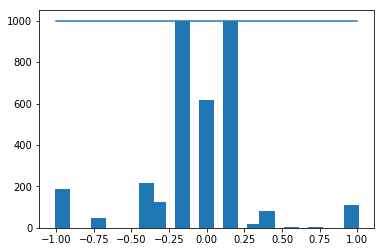

In [0]:
   # Extra enter steering removal with camera index
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['Steering'])):
    if data['Steering'][i] >= bins[j] and data['Steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
   
print('Removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('Remaining:',len(data))

hist, _ = np.histogram(data['Steering'], (num_bins))
plt.bar(center, hist, width=0.1)
plt.plot((np.min(data['Steering']),np.max(data['Steering'])),(samples_per_bin, samples_per_bin))

In [0]:
   # Index and append Steering and Camera values
print(data.iloc[1])
def load_img_steering(datadir,df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center = indexed_data[0]  # this was 1
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[1]))
    
  image_paths = np.asarray(image_path)
  steering = np.asarray(steering)
  return image_paths, steering

image_paths, steerings = load_img_steering(datadir, data)

Camera      Charrito_Log07_Pic_2.jpg
Steering    0.142857                
Name: 1, dtype: object


In [0]:
   # Split the dataset in Train and Valid groups, 80% of test
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 2725
Valid Samples: 682


Text(0.5, 1.0, 'Validation set')

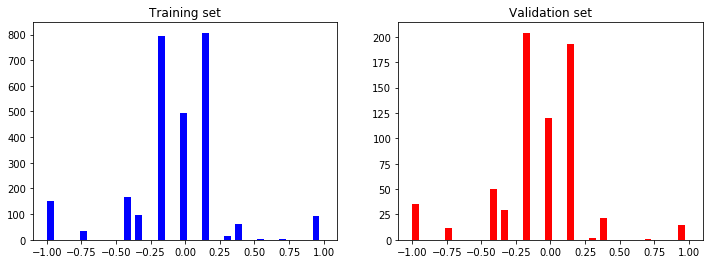

In [0]:
   # Show distribution of the dataset split
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

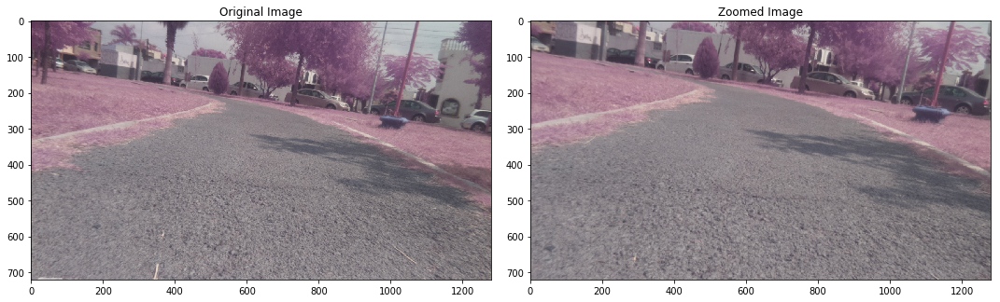

In [0]:
   # Zoom Augmentation to be used on Test Split only
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]  
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

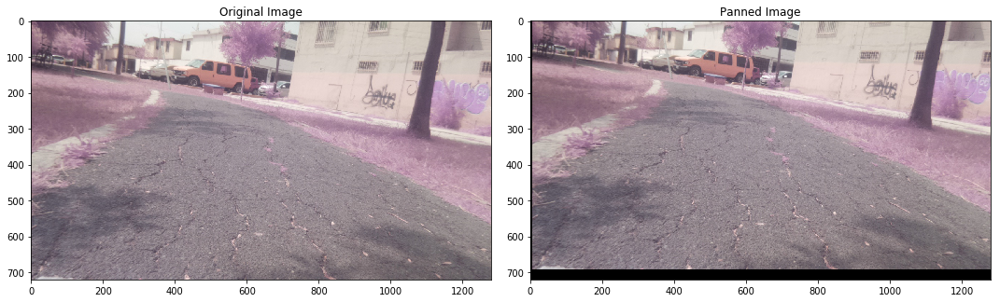

In [0]:
   # Pan Augmentation to be used on Test Split only
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

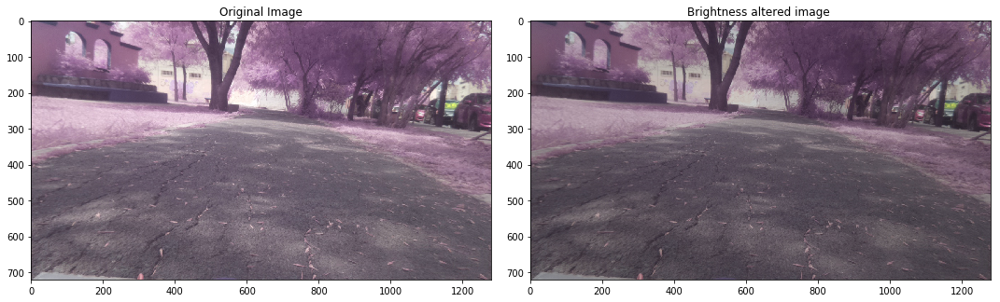

In [0]:
   # Brightness Augmentation to be used on Test Split only
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.14285714285714285')

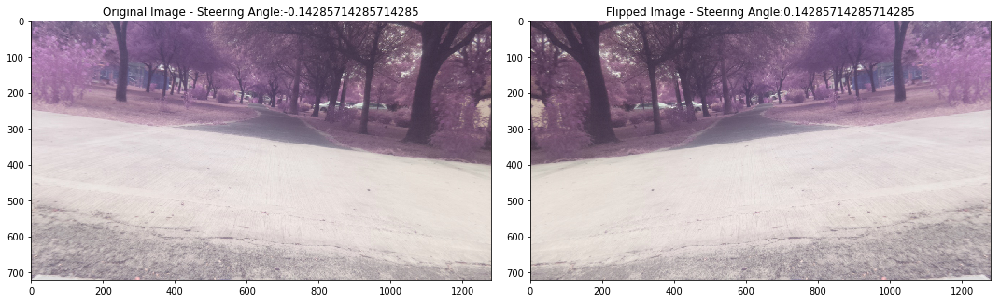

In [0]:
   # Flip Image Augmentation to be used on Test Split only
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

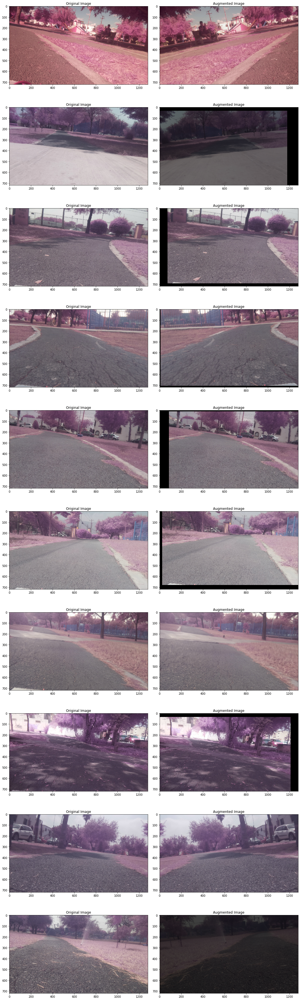

In [0]:
   # Random augmentation on the test split
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

Text(0.5, 1.0, 'Preprocessed Image')

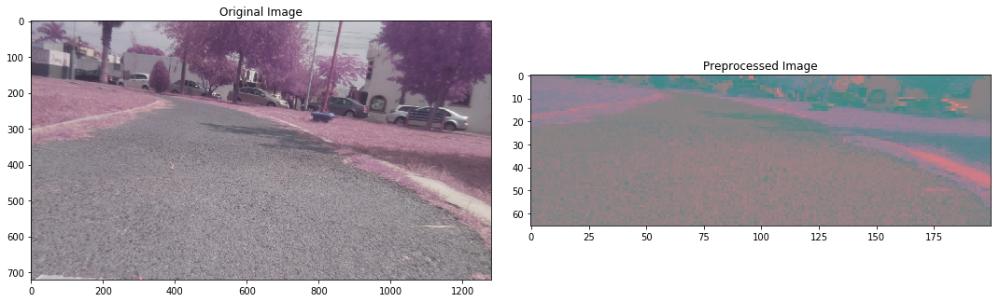

In [0]:
   # Image Preprocessing, not required to find lanes nor canny.
   # CNN and Nvidia model can learn to find features by itself!
def img_preprocess(img):
    img = img[150:700,:,:]     # Crops the unnecessary top and bottom side of the road
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)  # reduce color resolution as it is not important feature
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [0]:
   # Batch generator, to process images in batches and save memory
   # this batch generator is directly fed to the training -Fit-
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering)) #! 

Text(0.5, 1.0, 'Validation Image')

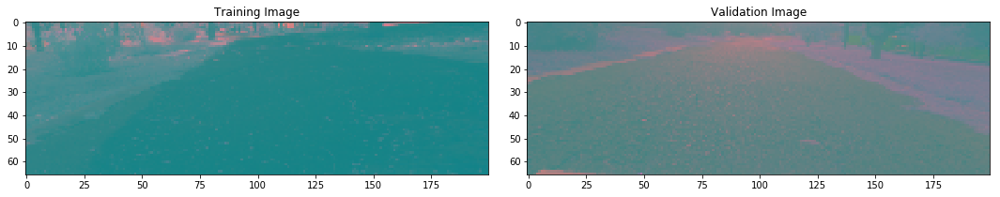

In [0]:
   # Split Train and Validation sets with batch generator
   # and augmented Test images, Val images should be original
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [0]:
   # End to end learning self driving car
def nvidia_model():
  model = Sequential()
  model.add(Convolution2D(24, 5, 5, subsample=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Convolution2D(36, 5, 5, subsample=(2, 2), activation='elu'))
  model.add(Convolution2D(48, 5, 5, subsample=(2, 2), activation='elu'))
  model.add(Convolution2D(64, 3, 3, activation='elu'))
  model.add(Convolution2D(64, 3, 3, activation='elu'))
  
  model.add(Flatten())
  
  model.add(Dense(100, activation = 'elu'))
  model.add(Dense(50, activation = 'elu'))
  model.add(Dense(10, activation = 'elu'))
 
  model.add(Dense(1))
  
  optimizer = Adam(lr=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [0]:
   # Fit Generator allows to train the model in batches
   # to save memory when large amount of images is trained
model = nvidia_model()
print(model.summary())
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300, 
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(24, (5, 5), input_shape=(66, 200, ..., activation="elu", strides=(2, 2))`
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(36, (5, 5), activation="elu", strides=(2, 2))`
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(48, (5, 5), activation="elu", strides=(2, 2))`
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), activation="elu")`
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), act

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 31, 98, 24)        1824      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 47, 36)        21636     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 5, 22, 48)         43248     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 3, 20, 64)         27712     
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 1, 18, 64)         36928     
_________________________________________________________________
flatten_1 (Flatten)          (None, 1152)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               115300    
__________

Text(0.5, 0, 'Epoch')

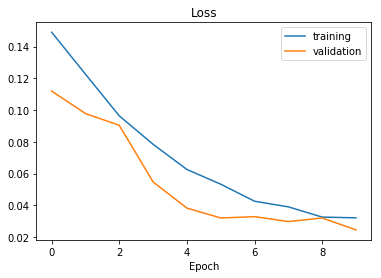

In [0]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [0]:
# Save the model and then use it with real data from the car
model.save('Charrito_model.h5')

from google.colab import files
files.download('Charrito_model.h5')
